In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from tqdm import trange

matplotlib.use('Agg')

# Multi-Armed Bandit

In [ ]:
class Bandits:
  def __init__(self,k_arm=10, epsilon=0.,c=0.,alpha=0.,baseline =True,
               methods = 'greedy',iterations=1000):
    self.k = k_arm
    self.eps = epsilon
    self.c = c
    self.alpha =alpha
    self.iterations =iterations
    self.baseline = baseline
    self.action_means = np.random.normal(0,1,k_arm)
    self.actions = np.arange(self.k)
    self.initial_aciton = self.action_means
    self.method = methods
    self.n = 0
    self.mean_rew = 0
    self.mean_reg = 0
    self.reward = np.zeros(iterations)
    self.regret = np.zeros(iterations)
    self.action_values = np.zeros(shape=(self.k,), dtype=np.float)
    self.H = np.zeros(self.k)
    self.action_n_t = np.ones(shape=(self.k,), dtype=np.int)
   
  def pull(self,a):

    reward = np.random.normal(self.action_means[a], 1) # 
    return reward

  def softmax(self):
    self.prob_action = np.exp(self.H - np.max(self.H))/np.sum(np.exp(self.H - np.max(self.H)), axis=0)

  def run(self):
    optimal_action = np.argmax(self.action_means)
    reward = []
    regret = []
    for i in range(self.iterations):
      self.softmax()

      if self.method is "greedy":
        a_t = np.argmax(self.action_values)
        rew_i = self.pull(a_t)
      if self.method is "epsilon_greedy":
        random_num = np.random.uniform()
        if random_num < self.eps:
          a_t = np.random.randint(low=0, high=self.k)
        else: 
          a_t = np.argmax(self.action_values)
        rew_i = self.pull(a_t)
      if self.method is "UCB":
        a_t = np.argmax(self.action_values + 
                        self.c * np.sqrt((np.log(self.n)) / self.action_n_t))
        rew_i = self.pull(a_t)
      if self.method is "gradient":
        a_t = np.random.choice(self.actions, p=self.prob_action)
        rew_i = self.pull(a_t)


      self.n += 1
      self.action_n_t[a_t] += 1
      reg_i = self.action_means[optimal_action] - rew_i
      # reward for optimal action - np.sum(rew_pull)
      self.mean_rew = self.mean_rew + (rew_i-self.mean_rew)/self.n
      self.mean_reg = self.mean_reg + (reg_i-self.mean_reg)/self.n
      if self.method is "gradient":
        if self.baseline is True:
          self.H[a_t] = self.H[a_t] + self.alpha * (rew_i - self.mean_rew) *(1 - self.prob_action[a_t])
          actions_not_taken = self.actions!=a_t
          self.H[actions_not_taken] = self.H[actions_not_taken]- self.alpha*(rew_i - self.mean_rew)* self.prob_action[actions_not_taken]
        else:
          # Update preferences
          self.H[a_t]=self.H[a_t]+self.alpha*(rew_i)*(1 - self.prob_action[a_t])
          act_not_taken = self.actions!=a_t
          self.H[act_not_taken]=self.H[act_not_taken]-self.alpha*(rew_i)*self.prob_action[act_not_taken]

      best_reward = np.max(self.action_values)
      self.reward[i] = rew_i#self.mean_rew#rew_i#.append(rew_i)
      #reg_i#self.mean_reg
      #regret.append(self.action_means[optimal_action] - rew_i)
      self.action_values[a_t] = self.action_values[a_t] +(1/self.action_n_t[a_t])*(rew_i - self.action_values[a_t])
      best_reward = self.action_means[optimal_action]#np.max(self.action_values)
      self.regret[i]= np.sum(self.reward) - best_reward 
    # return reward,regret
          
  def reset(self):
    # Resets results while keeping settings
    self.n = 0
    self.action_means = self.initial_actions
    self.k_n = np.zeros(k)
    self.mean_reward = 0
    self.reward = np.zeros(iters)
    self.k_reward = np.zeros(k)
    self.regret = np.zeros(iters)
    self.action_values = np.zeros(shape=(self.k,), dtype=np.float)
    self.action_n_t = np.ones(shape=(self.k,), dtype=np.int)



In [ ]:
k = 10
iters = 1000
episodes = 2000

## Ans 1.2:

---
Ans 1.2:
The initial expectation was that the greedy method will have higher reward as it exploits on the current maximum from the current optimal action values to get the reward. But we see that with epsilon greedy the more the agent is able to explore the average reward increases.

Although greedy method improved sligthly faster in the early 'pulls' but then it got leveled off at a lower level. The greedy method got stuck performing suboptimal actions in the longer run getting only 1 point reward per step consistently whereas the epsilon greedy methods were able to get 1.35 reward per step. The outcome from these plots is that the epsilon greedy method much better in the longer run as they continued to explore and to improve their chances of recognizing the optimal action.







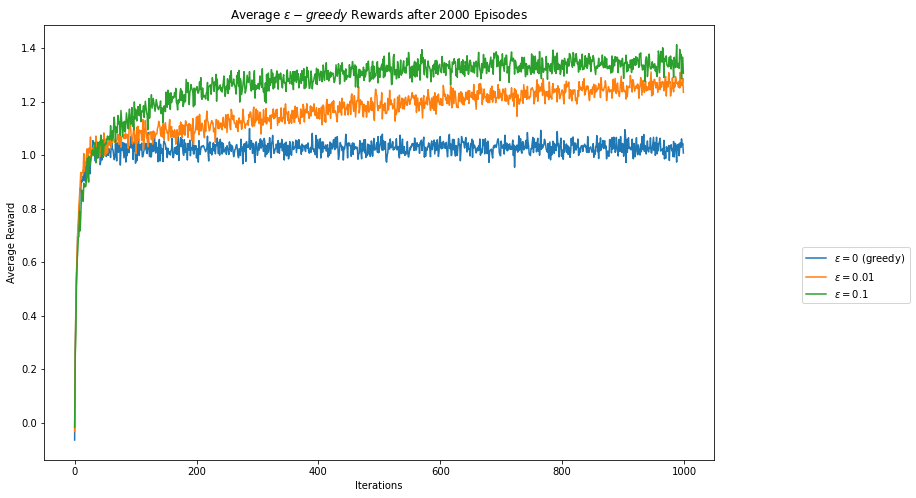

In [ ]:

greedy_rewards = []
eps_greedy_01_rewards = [] 
eps_greedy_1_rewards = []
greedy_regrets = []
eps_greedy_01_regrets = [] 
eps_greedy_1_regrets = []

for i in range(episodes):
  eps_0 = Bandits(k_arm=k,epsilon=0,methods="greedy")
  eps_01 = Bandits(k_arm=k, epsilon=0.01,methods = "epsilon_greedy")
  eps_1 = Bandits(k_arm=k,epsilon= 0.1,methods = "epsilon_greedy")
   
  # Run experiments
  eps_0.run()
  eps_01.run()
  eps_1.run()
    
  # Rewards 
  greedy_rewards.append(eps_0.reward)
  eps_greedy_01_rewards.append(eps_01.reward)
  eps_greedy_1_rewards.append(eps_1.reward)
  # Regrets
  greedy_regrets.append(eps_0.regret)
  eps_greedy_01_regrets.append(eps_01.regret)
  eps_greedy_1_regrets.append(eps_1.regret)

plt.figure(figsize=(12,8))
plt.plot(np.array(greedy_rewards).mean(axis=0), label="$\epsilon=0$ (greedy)")
plt.plot(np.array(eps_greedy_01_rewards).mean(axis=0), label="$\epsilon=0.01$")
plt.plot(np.array(eps_greedy_1_rewards).mean(axis=0), label="$\epsilon=0.1$")
plt.legend(bbox_to_anchor=(1.3, 0.5))
plt.xlabel("Iterations")
plt.ylabel("Average Reward")
plt.title("Average $\epsilon-greedy$ Rewards after " + str(episodes) 
    + " Episodes")
plt.show()


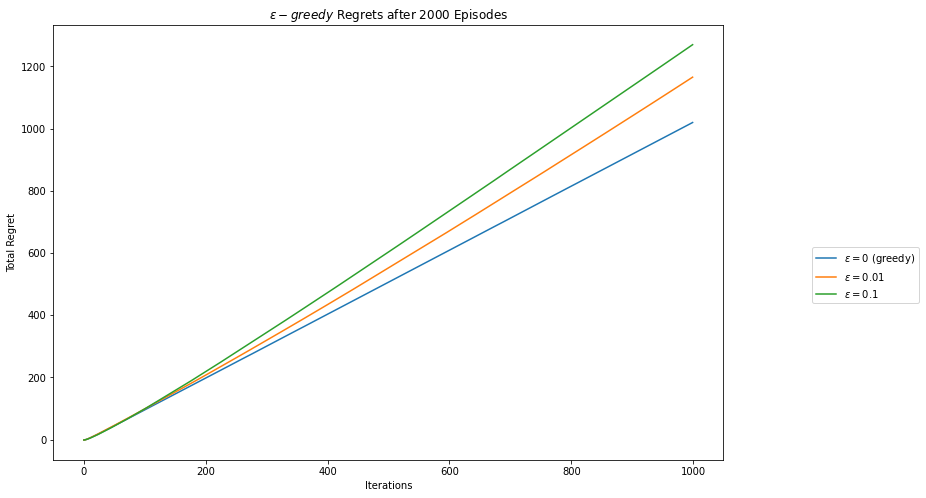

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(np.array(greedy_regrets).mean(axis=0), label="$\epsilon=0$ (greedy)")
plt.plot(np.array(eps_greedy_01_regrets).mean(axis=0), label="$\epsilon=0.01$")
plt.plot(np.array(eps_greedy_1_regrets).mean(axis=0), label="$\epsilon=0.1$")
plt.legend(bbox_to_anchor=(1.3, 0.5))
plt.xlabel("Iterations")
plt.ylabel("Total Regret")
plt.title("$\epsilon-greedy$ Regrets after " + str(episodes) 
    + " Episodes")
plt.show()

## Ans 1.3:

---
Ans 1.3:

Setting the epsilon to 0.9 basically means that the agent performs 90percent of the time to explore rather than exploiting on optimal/sub-optimal action. Initial expectation was that the agent performs either better than greedy method or achieve a reward higher than epsilon=0.01 but the results were opposite. epsilon=0.9 performed even worse than greedy method.

The agent was on average able to achieve only 0.15 points as reward per step and the regret being higher in the range of 1.5 to 1.35. This indicates that the agent kept on exploring and could have exploited for action to achieve a higher reward as the regret is around 1.5-1.35.

From this we can say that there needs to be a balanced approach for exploration and exploitation to maximize the reward.




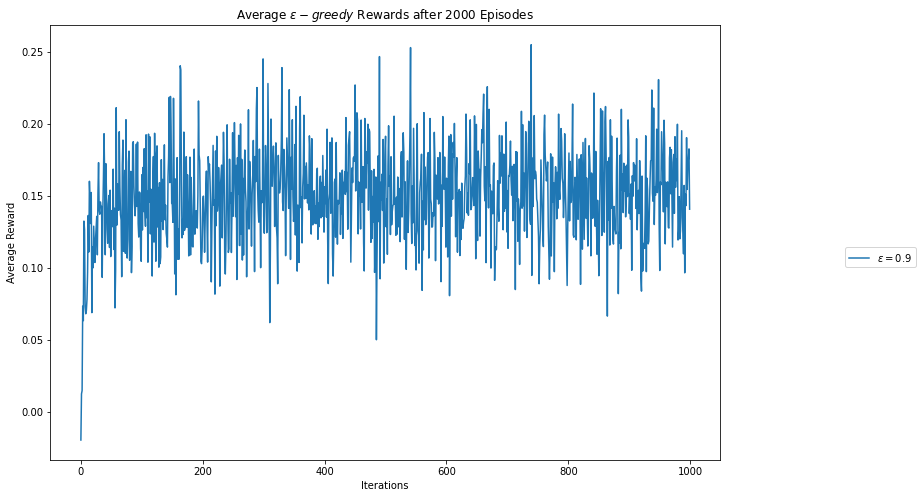

In [ ]:


eps_greedy_9_rewards = []
eps_greedy_9_regrets = []

for i in range(episodes):
  eps_9 = Bandits(k_arm=k,epsilon= 0.9,methods = "epsilon_greedy")
   
  # Run experiment
  eps_9.run()
    
  # Rewards 
  eps_greedy_9_rewards.append(eps_9.reward)
  # Regrets
  eps_greedy_9_regrets.append(eps_9.regret)

plt.figure(figsize=(12,8))
plt.plot(np.array(eps_greedy_9_rewards).mean(axis=0), label="$\epsilon=0.9$")
plt.legend(bbox_to_anchor=(1.3, 0.5))
plt.xlabel("Iterations")
plt.ylabel("Average Reward")
plt.title("Average $\epsilon-greedy$ Rewards after " + str(episodes) 
    + " Episodes")
plt.show()


Text(0.5, 1.0, '$\\epsilon-greedy$ Regrets after 2000 Episodes')

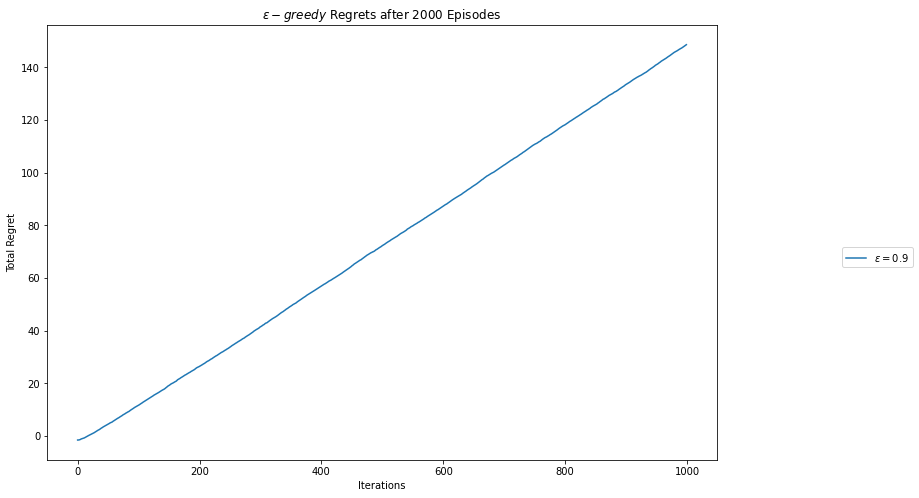

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(np.array(eps_greedy_9_regrets).mean(axis=0), label="$\epsilon=0.9$")
plt.legend(bbox_to_anchor=(1.3, 0.5))
plt.xlabel("Iterations")
plt.ylabel("Total Regret")
plt.title("$\epsilon-greedy$ Regrets after " + str(episodes) 
    + " Episodes")

## Ans 1.4

---
Ans 1.4:

Expectation was that both the methods would mostly perform similar as the epsilon is zero for them. But look at the results we can see that adding the optimistic initial value of +3 the agent explores a more in the beginning when compared to Q(a) as +0. As iteration increases the agent with optimistic initial values performs less exploration and more exploitation to achieve higher rewards compared to a normal/usual greedy setting.

In [ ]:


k = 10
iters = 1000
episodes = 2000
opti_initial_val_3 = np.repeat(3.,k)
opti_val_rewards_3 = [] 
opti_val_rewards_0 = [] 
opti_initial_val_0 = np.repeat(0., k)
opti_val_rewards_100 = []
opti_initial_val_100 = np.repeat(0., k)
opti_3_regrets = []
opti_0_regrets = [] 
opti_100_regrets = []
for i in range(episodes):
  opt_val_3 = Bandits(k_arm=k,epsilon=0.)
  opt_val_3.action_values = opti_initial_val_3.copy()
  opt_val_3.action_n_t = np.ones(k)
  opt_val_0 = Bandits(k_arm=k,epsilon= 0.)
  opt_val_0.action_values = opti_initial_val_0.copy()
  opt_val_0.action_n_t = np.ones(k)
  opt_val_100 = Bandits(k_arm=k,epsilon=0.)
  opt_val_100.action_values = opti_initial_val_100.copy()
  opt_val_100.action_n_t = np.ones(k) 
  # Run experiments

  opt_val_3.run()
  opt_val_0.run()
  opt_val_100.run()
    
  # Rewards
  opti_val_rewards_3.append(opt_val_3.reward) 
  opti_val_rewards_0.append(opt_val_0.reward)
  opti_val_rewards_100.append(opt_val_100.reward)
  opti_3_regrets.append(opt_val_3.regret)
  opti_0_regrets.append(opt_val_0.regret)
  opti_100_regrets.append(opt_val_100.regret)
 


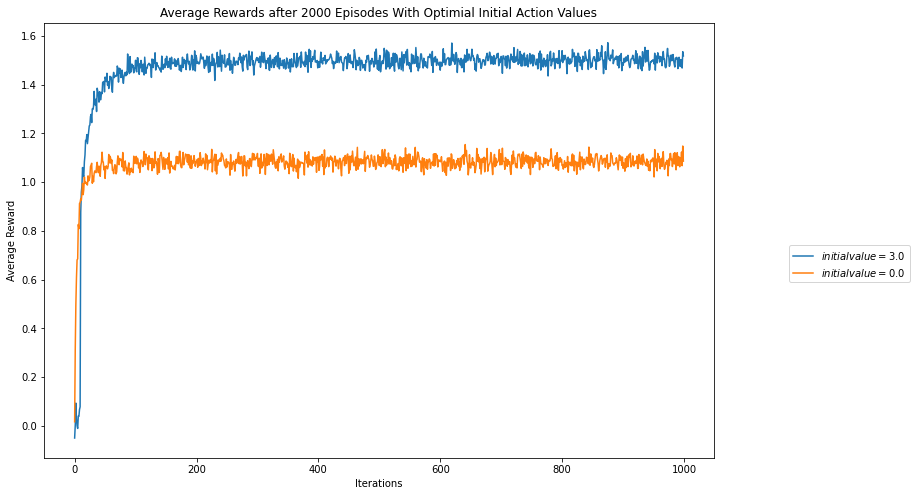

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(np.array(opti_val_rewards_3).mean(axis=0),
         label="$initial value= 3.0$")
plt.plot(np.array(opti_val_rewards_0).mean(axis=0),
         label="$initial value= 0.0$")
plt.legend(bbox_to_anchor=(1.3, 0.5))
plt.xlabel("Iterations")
plt.ylabel("Average Reward")
plt.title("Average Rewards after " + str(episodes) 
    + " Episodes With Optimial Initial Action Values")
plt.show()


## Ans 1.5:

---
Ans 1.5:
Based on the results from question 1.4, expectation before the experiment was that the optimistic initial value of +100 will either perform same or better than the initial optimistic value of +3. But on the contrary the results showed us that +100 optimistic initial values performed at par with usual greedy setting with Q as +0.
***reason***

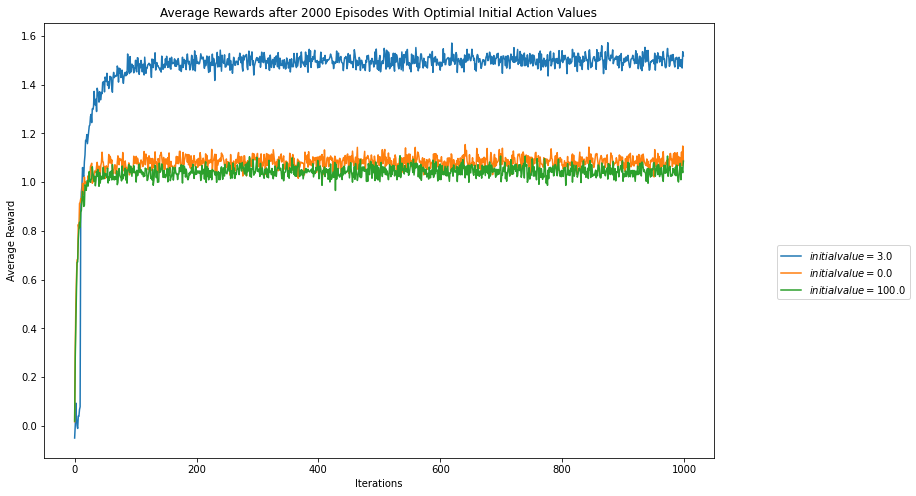

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(np.array(opti_val_rewards_3).mean(axis=0), 
         label="$initial value= 3.0$")
plt.plot(np.array(opti_val_rewards_0).mean(axis=0),
         label="$initial value= 0.0$")
plt.plot(np.array(opti_val_rewards_100).mean(axis=0),
         label="$initial value= 100.0$")

plt.legend(bbox_to_anchor=(1.3, 0.5))
plt.xlabel("Iterations")
plt.ylabel("Average Reward")
plt.title("Average Rewards after " + str(episodes) 
    + " Episodes With Optimial Initial Action Values")
plt.show()


## Ans 1.6:

---
Ans 1.6:
'c' is the confidence value which controls the level of exploration.
Without the experiment it was expected that with higher exploration the reward might be higher but from the graphs we see that if greater the exploration the lower the mean total reward. We see that after the initial priming steps the UCB algorithm has already locked on to the optimal action and exploration is more necessary in the initial iterations after which it can produce the best results by just exploit this knowledge. This the reason we see the 'c' value of 1 performs much better than a higher 'c' or a too low 'c'.

In [ ]:
ucb_rewards_02 = []
ucb_rewards_1 = []
ucb_rewards_5 = []
ucb_regret_02 = []
ucb_regret_1 = []
ucb_regret_5 = []

for i in range(episodes): 
  # Initialize bandits
  ucb_02 = Bandits(k, c=0.2, methods="UCB")
  ucb_1 = Bandits(k, c=1., methods="UCB")
  ucb_5 = Bandits(k, c=5., methods="UCB")
  ucb_02.run()
  ucb_1.run()
  ucb_5.run()
     
  ucb_rewards_02.append(ucb_02.reward)
  ucb_rewards_1.append(ucb_1.reward)
  ucb_rewards_5.append(ucb_5.reward)
  ucb_regret_02.append(ucb_02.regret)
  ucb_regret_1.append(ucb_1.regret)
  ucb_regret_5.append(ucb_5.regret)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:50: RuntimeWarning: divide by zero encountered in log
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:50: RuntimeWarning: invalid value encountered in sqrt


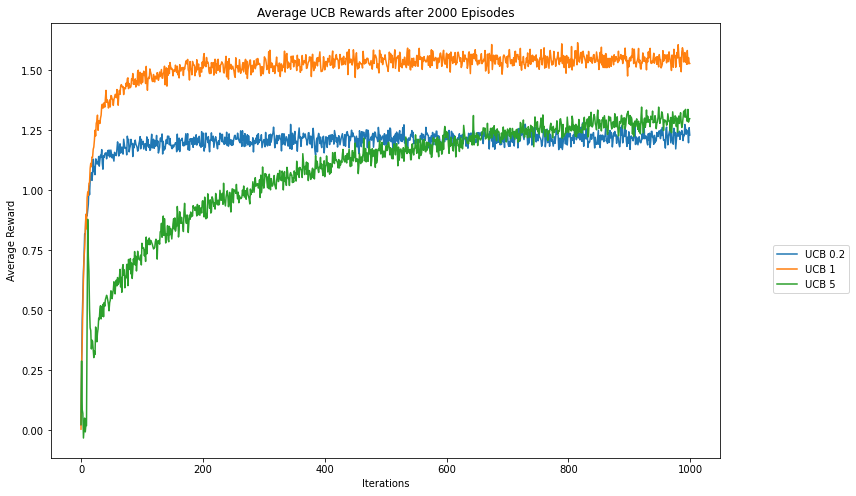

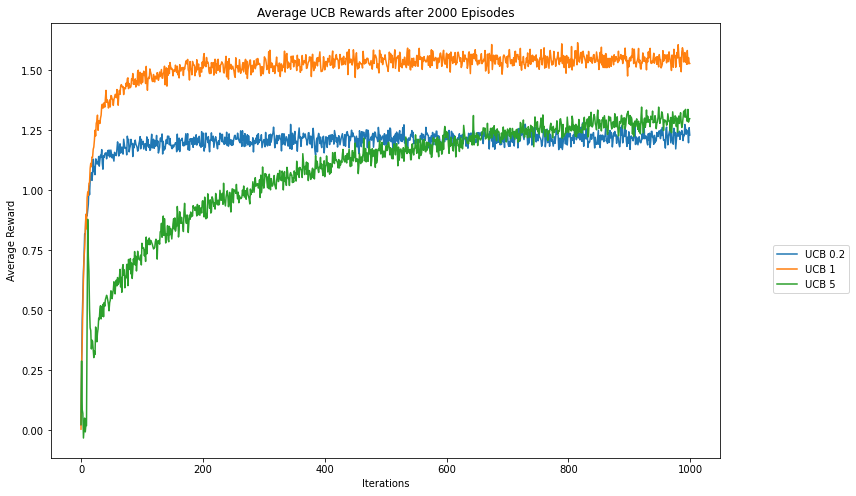

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(np.array(ucb_rewards_02).mean(axis=0), label="UCB 0.2")
plt.plot(np.array(ucb_rewards_1).mean(axis=0), label="UCB 1")
plt.plot(np.array(ucb_rewards_5).mean(axis=0), label="UCB 5")
plt.legend(bbox_to_anchor=(1.2, 0.5))
plt.xlabel("Iterations")
plt.ylabel("Average Reward")
plt.title("Average UCB Rewards after "+ str(episodes) + " Episodes")
plt.show()

## Ans 1.7:

---
Ans 1.7:
In the gradient bandit experiment it was expected that the adding baseline should impact than a setup without baseline as in gradient bandit we calculate the numerical perference H(a) for an action. The larger the prefernce the more the action is taken. A relative prefernce of one ction over the other is important in this method.
From the graphs we can notice that Gradient bandit system without baseline tend to stuck with suboptimal rewards when compared to with baseline setup.
In gradient bandit with baseline we can see and deduce from the graphs that for alpha =0.1 the exploration is higher in initial iterations when comapred to an alpha=0.5. Due to this initial exploration and deduction of the optimal action the average reward for alpha=0.1 is higher and more steady over the iterations.

In [ ]:
class G_Bandits:
  def __init__(self,k_arm=10, epsilon=0.,c=0.,alpha=0.,baseline =True,
               methods = 'greedy',iterations=1000):
    self.k = k_arm
    self.eps = epsilon
    self.c = c
    self.alpha =alpha
    self.iterations =iterations
    self.baseline = baseline
    self.action_means = np.random.normal(4,1,k_arm)
    self.actions = np.arange(self.k)
    self.initial_aciton = self.action_means
    self.method = methods
    self.n = 0
    self.mean_rew = 0
    self.mean_reg = 0
    self.reward = np.zeros(iterations)
    self.regret = np.zeros(iterations)
    self.action_values = np.zeros(shape=(self.k,), dtype=np.float)
    self.k_reward = np.zeros(k)
    self.H = np.zeros(self.k)
    self.action_n_t = np.ones(shape=(self.k,), dtype=np.int)
   
  def pull(self,a):

    reward = np.random.normal(self.action_means[a], 1)
    return reward

  def softmax(self):
    self.prob_action = np.exp(self.H - np.max(self.H)) \
            / np.sum(np.exp(self.H - np.max(self.H)), axis=0)

  def run(self):
    optimal_action = np.argmax(self.action_means)
    reward = []
    regret = []
    for i in range(self.iterations):
      self.softmax()

      if self.method is "greedy":
        a_t = np.argmax(self.action_values)
        rew_i = self.pull(a_t)
      if self.method is "epsilon_greedy":
        random_num = np.random.uniform()
        if random_num < self.eps:
          a_t = np.random.randint(low=0, high=self.k)
        else: 
          a_t = np.argmax(self.action_values)
        rew_i = self.pull(a_t)
      if self.method is "UCB":
        a_t = np.argmax(self.action_values + self.c * \
                        np.sqrt((np.log(self.n)) / self.action_n_t))
        rew_i = self.pull(a_t)
      if self.method is "gradient":
        a_t = np.random.choice(self.actions, p=self.prob_action)
        rew_i = self.pull(a_t)


      self.n += 1
      self.action_n_t[a_t] += 1
      reg_i = self.action_means[optimal_action] - rew_i

      self.mean_rew = self.mean_rew + (rew_i-self.mean_rew)/self.n
      self.mean_reg = self.mean_reg + (reg_i-self.mean_reg)/self.n
      if self.method is "gradient":
        if self.baseline is True:
          self.H[a_t] = self.H[a_t] + self.alpha * (rew_i - self.mean_rew) * \
                          (1 - self.prob_action[a_t])
          actions_not_taken = self.actions!=a_t
          self.H[actions_not_taken] = self.H[actions_not_taken] - \
                                      self.alpha * (rew_i - self.mean_rew)*\
                                       self.prob_action[actions_not_taken]
        else:
          # Update preferences
          self.H[a_t] = self.H[a_t] + self.alpha * (rew_i) * \
                        (1 - self.prob_action[a_t])
          actions_not_taken = self.actions!=a_t
          self.H[actions_not_taken] = self.H[actions_not_taken] - self.alpha *\
                                    (rew_i)*self.prob_action[actions_not_taken]


      self.reward[i] = rew_i#self.mean_rew#rew_i#.append(rew_i)
      #reg_i#self.mean_reg
      #regret.append(self.action_means[optimal_action] - rew_i)
      self.action_values[a_t] = self.action_values[a_t] + \
                                (1/self.action_n_t[a_t])* \
                                (rew_i - self.action_values[a_t])
      self.regret[i]  = np.sum(self.reward) - np.max(self.action_values) 
      
    # return reward,regret
          
  def reset(self):
    # Resets results while keeping settings
    self.n = 0
    self.action_means = self.initial_actions
    self.k_n = np.zeros(k)
    self.mean_reward = 0
    self.reward = np.zeros(iters)
    self.k_reward = np.zeros(k)
    self.regret = np.zeros(iters)
    self.action_values = np.zeros(shape=(self.k,), dtype=np.float)
    self.action_n_t = np.ones(shape=(self.k,), dtype=np.int)



In [ ]:


# ucb = ucb_bandit(k, 2, iters, mu=grad.mu)
# ucb.mu = grad.mu
 
# ucb_rewards = np.zeros(iters)
grad_rewards_01 = []
grad_rewards_05 = []
grad_rewards_01_b = []
grad_rewards_05_b = []

grad_regret_01 = []
grad_regret_05 = []
grad_regret_01_b = []
grad_regret_05_b = []
opt_grad_01 = 0
opt_grad_05 = 0
opt_grad_01_b = 0
opt_grad_05_b = 0

# opt_ucb = 0
 
episodes = 2000
# Run experiments
for i in range(episodes):
  # Reset counts and rewards
  grad_01 = G_Bandits(k, alpha= 0.1,baseline=False,methods="gradient")
  grad_05 = G_Bandits(k,alpha= 0.5, baseline=False,methods="gradient")
  grad_01_b = G_Bandits(k,alpha= 0.1,baseline=True,methods="gradient")
  grad_05_b = G_Bandits(k,alpha= 0.5,baseline=True,methods="gradient")


  # ucb.reset()
  # ucb.mu = grad.mu
     
  # Run experiments
  grad_01.run()
  grad_05.run()
  grad_01_b.run()
  grad_05_b.run()
    
  # Update long-term averages
  grad_rewards_01.append(grad_01.reward)
  grad_rewards_05.append(grad_05.reward)
  grad_rewards_01_b.append(grad_01_b.reward)
  grad_rewards_05_b.append(grad_05_b.reward)
  grad_regret_01.append(grad_01.regret)
  grad_regret_05.append(grad_05.regret)
  grad_regret_01_b.append(grad_01_b.regret)
  grad_regret_05_b.append(grad_05_b.regret)
     
  # Count optimal actions
  opt_grad_01 += grad_01.action_n_t[np.argmax(grad_01.action_means)]
  opt_grad_05 += grad_05.action_n_t[np.argmax(grad_05.action_means)]
  opt_grad_01_b += grad_01_b.action_n_t[np.argmax(grad_01_b.action_means)]
  opt_grad_05_b+= grad_05_b.action_n_t[np.argmax(grad_05_b.action_means)]
     


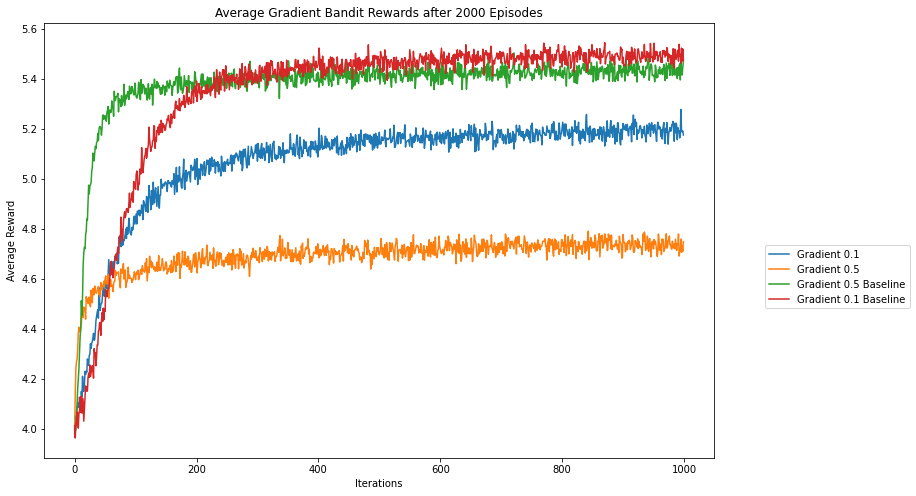

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(np.array(grad_rewards_01).mean(axis=0), label="Gradient 0.1")
plt.plot(np.array(grad_rewards_05).mean(axis=0), label="Gradient 0.5")
plt.plot(np.array(grad_rewards_05_b).mean(axis=0), 
         label="Gradient 0.5 Baseline")
plt.plot(np.array(grad_rewards_01_b).mean(axis=0),
         label="Gradient 0.1 Baseline")

# plt.plot(ucb_rewards, label="UCB")
plt.legend(bbox_to_anchor=(1.3, 0.5))
plt.xlabel("Iterations")
plt.ylabel("Average Reward")
plt.title("Average Gradient Bandit Rewards after "+ str(episodes) + " Episodes")
plt.show()


---
## Ans 1.8:

Ranking them based on the regret we can say that Gradient bandit performed better than the rest, the difference between UCB and optimistic initial value is not too much. The worst performing method is greedy method.
The probable reason which we can infer from the graphs is that, grdient descent does more exploration in that start of the iterations and after doing exploration it exploits the optimal action or preferred action to maximise the reward

# Dynamic Programing


## Ans 2.1


---
Ans 2.1
Given that $\gamma =1.0$ (undiscounted) and reward is -1.
$ q_{\pi}(11,down) = E_{\pi}[G_t | S_t =s,A_t=a ]$

$ q_{\pi}(11,down) = R_t + \gamma E_{\pi}[G_{t+1} | S_{t+1} =s']$

$R_t =-1$, here s' is state 16. From 2.2 we know that $V(16) = -39.0 $ is Value for State 16  

$ q_{\pi}(11,down) = -1 + 1(V(16))$

$ q_{\pi}(11,down) = -1 + 1(-39) = -40.0$

Now similarly for $ q_{\pi}(7,down)$, from 2.2 we know that V(11) = -36.3.
$ q_{\pi}(7,down) = R_t + \gamma E_{\pi}[G_{t+1} | S_{t+1} =s']$
$ q_{\pi}(7,down) = -1 + 1(V(16))$

$ q_{\pi}(7,down) = -1 + 1(-36.3) = -37.3$



## Ans 2.2

---
Ans 2.2: The initial state values and the policy is given by the below image:

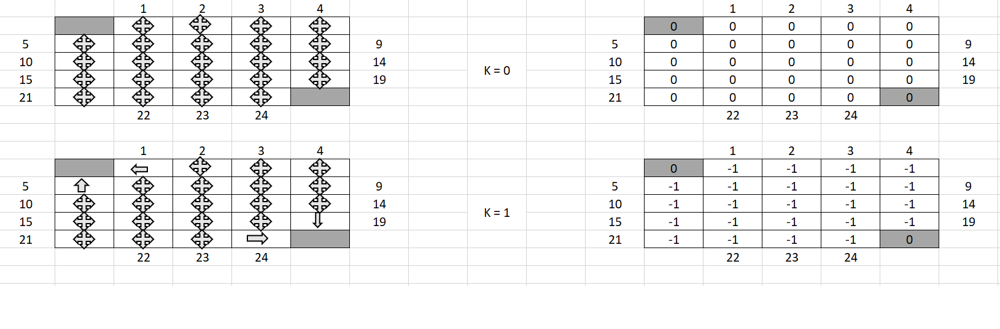

Applying the policy evaluation algorithm here starting from state 1 for K=2.
$V(s_1) = \sum_{a} \pi(a|s) \sum_{s',r}p(s',r|s,a)[r+ \gamma v_{\pi}(s') ]$

As it is equiprobable policy , we get:
$ V(s_1) = 0.25*[( -1.0+1.0*0.0)+(-1.0+1*-1.0)+(-1.0+1*-1.0)+(-1.0+1*-1.0) ] = 0.25*(-7) \approx -1.8$

$V(s_1) \approx -1.8$

Executing above step for all the states we get:

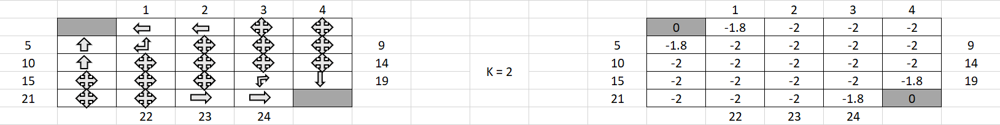

Now we do similar iteration till we get the optimal policy(i.e no change in policy)

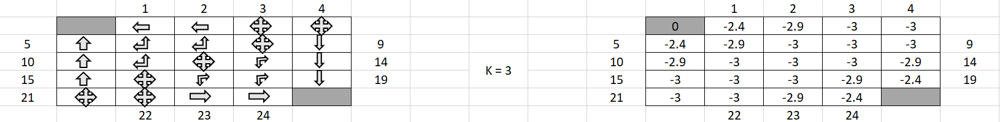

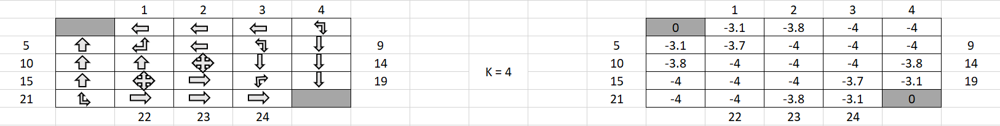

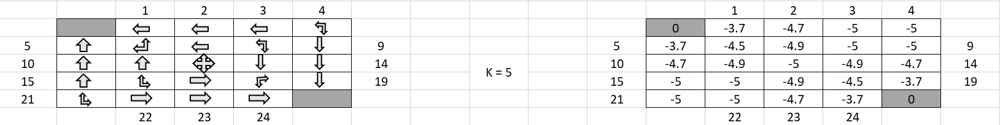

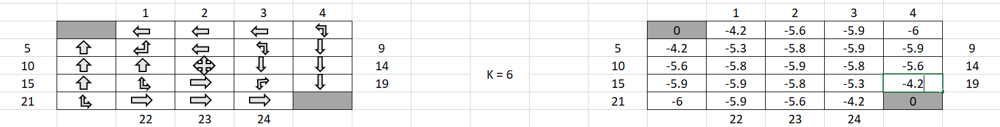

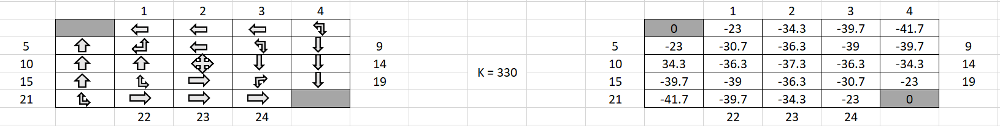

We can see that we reach an optimal policy at iteration k=5 and post that all policies are optimal.

## Ans 2.3

In [147]:
import argparse
import numpy as np
import random

import matplotlib.pyplot as plt
from matplotlib import colors

In [148]:
class GW_env:
  def __init__(self, size, actions, rewards, terminal_state,seed):
    self.n = size
    self.actions = actions
    self.rewards = rewards
    self.x = terminal_state[0][0]
    self.y = terminal_state[0][1]
    self.x2 = terminal_state[1][0]
    self.y2 = terminal_state[1][1]
    self.seed = seed

  def get_next_state(self,x, y, a):
    # Compute next state according to the action
    if a == 0:
      next_x = x
      next_y = max(0, y - 1)
    elif a == 1:
      next_x = max(0, x - 1)
      next_y = y
    elif a == 2:
      next_x = x
      next_y = min((self.n) - 1, y + 1)
    else:
      next_x = min((self.n) - 1, x + 1)
      next_y = y
    return next_x, next_y

    
  # def reset():

In [149]:
def build_grid(n, terminal, seed):
    actions = [0, 1, 2, 3]
    random.seed(seed)
    x1 = terminal[0][0]
    y1 = terminal[0][1]
    x2 = terminal[1][0]
    y2 = terminal[1][1]
    rewards = (-1) * np.ones((n, n))
    
    env = GW_env(n, actions, rewards, terminal_state=terminal,seed=seed)
    return env

In [150]:
def plot_grid(env):

    data = env.rewards.copy()
    # create discrete colormap
    cmap = colors.ListedColormap(['grey', 'white', 'red'])
    bounds = [-11, -2, 0, 12]
    norm = colors.BoundaryNorm(bounds, cmap.N)

    fig, ax = plt.subplots()
    ax.imshow(data, cmap=cmap, norm=norm)

    # draw gridlines
    ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
    ax.set_xticks(np.arange(-.5, env.n, 1))
    ax.set_yticks(np.arange(-.5, env.n, 1))

    plt.show()


def plot_v_values(v, n):

    fig, ax = plt.subplots()
    im = ax.imshow(v, cmap='YlOrBr', interpolation='nearest')

    # draw gridlines
    ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
    ax.set_xticks(np.arange(-.5, n, 1))
    ax.set_yticks(np.arange(-.5, n, 1))

    # Loop over data dimensions and create text annotations.
    for i in range(n):
        for j in range(n):
            text = ax.text(j, i, "{:.2f}".format(v[i, j]), ha="center", va="center", color="black")

    ax.set_title("Value function")
    fig.tight_layout()
    plt.show()


def plot_optimal_actions(env, pi):

    data = env.rewards.copy()
    
    # create discrete colormap
    cmap = colors.ListedColormap(['grey', 'white', 'red'])
    bounds = [-11, -2, 0, 12]
    norm = colors.BoundaryNorm(bounds, cmap.N)

    fig, ax = plt.subplots()
    ax.imshow(data, cmap=cmap, norm=norm)

    # draw gridlines
    ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
    ax.set_xticks(np.arange(-.5, env.n, 1))
    ax.set_yticks(np.arange(-.5, env.n, 1))

    # Loop over data dimensions and create text annotations.
    for i in range(env.n):
        for j in range(env.n):
            if (i ==0 and j ==0 )or (i==4 and j==4):
              continue
            arrow = get_arrow(pi[i, j, :])
            text = ax.text(j, i, arrow, fontsize=16, ha="center", va="center", color="black")

    ax.set_title("Policy")
    fig.tight_layout()
    plt.show()


def get_arrow(prob_arr):

    best_actions = np.where(prob_arr == np.amax(prob_arr))[0]
    if len(best_actions) == 1:
        if 0 in best_actions:
            return r"$\leftarrow$"
        if 1 in best_actions:
            return r"$\uparrow$"
        if 2 in best_actions:
            return r"$\rightarrow$"
        else:
            return r"$\downarrow$"

    elif len(best_actions) == 2:
        if 0 in best_actions and 1 in best_actions:
            return r"$\leftarrow \uparrow$"
        elif 0 in best_actions and 2 in best_actions:
            return r"$\leftrightarrow$"
        elif 0 in best_actions and 3 in best_actions:
            return r"$\leftarrow \downarrow$"
        elif 1 in best_actions and 2 in best_actions:
            return r"$\uparrow \rightarrow$"
        elif 1 in best_actions and 3 in best_actions:
            return r"$\updownarrow$"
        elif 2 in best_actions and 3 in best_actions:
            return r"$\downarrow \rightarrow$"

    elif len(best_actions) == 3:
        if 0 not in best_actions:
            return r"$\updownarrow \rightarrow$"
        elif 1 not in best_actions:
            return r"$\leftrightarrow \downarrow$"
        elif 2 not in best_actions:
            return r"$\leftarrow \updownarrow$"
        else:
            return r"$\leftrightarrow \uparrow$"

    else:
        return r"$\leftrightarrow \updownarrow$"



In [151]:
def check_terminal(env, x, y):
    # The value function on the terminal state always has value 0
    if x == env.x and y == env.y:
        return True
    if x == env.x2 and y == env.y2:
        return True
    else:
      return False

In [152]:
def evaluate_policy(env,policy,episodes=5):
  cumulative_reward = 0
  cumulative_timesteps = 0
  max_reward = 0
  min_timesteps = 200
  count = 0

  # iterate over multiple episodes - and log rewards and timestamps
  for _ in range(episodes):
    # env.reset()
    done = False
    curr_reward = 0
    curr_timesteps = 0
    curr_state_x = random.randint(0,4)
    curr_state_y = random.randint(0,4)   
    if (curr_state_x ==4 and curr_state_y==4) or (curr_state_x==0 and curr_state_y ==0):
      curr_state_x = random.randint(0,4)
      curr_state_y = random.randint(0,4)

    while not done:
      # sample action as per policy            
      action = np.random.choice(env.actions, size=1, 
                                p=policy[curr_state_x,curr_state_y,:])[0]
      curr_state_x,curr_state_y = env.get_next_state(curr_state_x,curr_state_y,
                                                 action)
      reward  = env.rewards[curr_state_x, curr_state_y]
      if (curr_state_x ==4 and curr_state_y==4) or (curr_state_x==0 and curr_state_y ==0):
        done = True
      curr_timesteps += 1
      curr_reward += reward
        
    min_timesteps = min(min_timesteps, curr_timesteps)
    max_reward = max(max_reward, curr_reward)
    cumulative_timesteps += curr_timesteps
    cumulative_reward += curr_reward

  # get average timestamps and rewards
  avg_timesteps = cumulative_timesteps / episodes
  avg_reward = cumulative_reward / episodes
  return avg_reward, avg_timesteps, max_reward, min_timesteps

In [153]:
def policy_evaluation(env, v, policy, gamma, theta):
    delta = theta + 1
    i = 0
    while delta >= theta:
        old_v = v.copy()
        delta = 0

        # Traverse all states
        for x in range(env.n):
            for y in range(env.n):
                # Run one iteration of the Bellman update rule for the value function
                check = check_terminal(env,x,y)
                vals =0
                if check is False:
                  for a in env.actions:
                  # Get next state
                    next_x, next_y = env.get_next_state(x, y, a)

                    vals += policy[x, y, a] * (env.rewards[next_x, next_y] + gamma * old_v[next_x, next_y])
                v[x,y] = vals
                # Compute difference
                delta = max(delta, abs(old_v[x, y] - v[x, y]))
        i += 1

    # Plot new value function
    plot_v_values(v, env.n)
    print("\nThe Policy Evaluation algorithm converged after {} iterations".format(i))


In [154]:

def policy_improvement(env, v, policy, gamma):
    policy_stable = True
    # Iterate states
    for x in range(env.n):
        for y in range(env.n):
            old_policy = policy[x, y, :].copy()
            # Iterate all actions
            best_actions = []
            max_v = None
            for a in env.actions:
                # Compute next state
                next_x, next_y = env.get_next_state(x, y, a)
                # Get value
                curr_val = env.rewards[next_x, next_y] + gamma * v[next_x, next_y]
                if max_v is None:
                    max_v = curr_val
                    best_actions.append(a)
                elif curr_val > max_v:
                    max_v = curr_val
                    best_actions = [a]
                elif curr_val == max_v:
                    best_actions.append(a)

            # Define new policy
            prob = 1/len(best_actions)
            for a in env.actions:
              policy[x, y, a] = prob if a in best_actions else 0
            # Check whether the policy has changed
            if not (old_policy == policy[x, y, :]).all():
                policy_stable = False
    return policy_stable,policy


### Policy Iteration

In [155]:
def policy_iteration(size, gamma, theta, seed):
    terminal = [(0,0),(4,4)]

    # Create initial environment
    env = build_grid(size, terminal, seed)
    i = 0
    plot_grid(env)

    # Generate initial value function and policy
    # v = get_init_v(size, 0, env.x, env.y,env.x2,env.y2)
    v = np.zeros((size,size))

  # Value function of terminal state must be 0
    v[env.x, env.y] = 0
    v[env.x2,env.y2] = 0
    policy = 1/4 * np.ones((size, size, 4))
    
    # Plot initial value function and policy
    plot_v_values(v, env.n)
    plot_optimal_actions(env, policy)

    policy_stable = False
    while not policy_stable:
        i += 1
        print("\nIteration {} of Policy Iteration algorithm".format(i))
        # Run the policy evaluation
        policy_evaluation(env, v, policy, gamma, theta)
        # Run the policy improvement algorithm
        policy_stable,policy = policy_improvement(env, v, policy, gamma)
        plot_optimal_actions(env, policy)
    avg_reward, avg_timesteps, max_reward, min_timesteps = evaluate_policy(env,
                                                           policy,episodes=5)
    print("\nPolicy Iteration algorithm converged after {} steps".format(i))
    return avg_reward, avg_timesteps, max_reward, min_timesteps


Iteration 1 of Policy Iteration algorithm

The Policy Evaluation algorithm converged after 655 iterations

Iteration 2 of Policy Iteration algorithm

The Policy Evaluation algorithm converged after 5 iterations

Iteration 3 of Policy Iteration algorithm

The Policy Evaluation algorithm converged after 1 iterations

Policy Iteration algorithm converged after 3 steps
Seed--> 1222 Average _reward -1.4 Average Timesteps 1.4

Iteration 1 of Policy Iteration algorithm

The Policy Evaluation algorithm converged after 655 iterations

Iteration 2 of Policy Iteration algorithm

The Policy Evaluation algorithm converged after 5 iterations

Iteration 3 of Policy Iteration algorithm

The Policy Evaluation algorithm converged after 1 iterations

Policy Iteration algorithm converged after 3 steps
Seed--> 9881 Average _reward -3.0 Average Timesteps 3.0

Iteration 1 of Policy Iteration algorithm


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



The Policy Evaluation algorithm converged after 655 iterations

Iteration 2 of Policy Iteration algorithm

The Policy Evaluation algorithm converged after 5 iterations

Iteration 3 of Policy Iteration algorithm

The Policy Evaluation algorithm converged after 1 iterations

Policy Iteration algorithm converged after 3 steps
Seed--> 333 Average _reward -2.4 Average Timesteps 2.4

Iteration 1 of Policy Iteration algorithm


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':



The Policy Evaluation algorithm converged after 655 iterations

Iteration 2 of Policy Iteration algorithm

The Policy Evaluation algorithm converged after 5 iterations

Iteration 3 of Policy Iteration algorithm

The Policy Evaluation algorithm converged after 1 iterations

Policy Iteration algorithm converged after 3 steps
Seed--> 34129 Average _reward -1.8 Average Timesteps 1.8

Iteration 1 of Policy Iteration algorithm

The Policy Evaluation algorithm converged after 655 iterations

Iteration 2 of Policy Iteration algorithm

The Policy Evaluation algorithm converged after 5 iterations

Iteration 3 of Policy Iteration algorithm

The Policy Evaluation algorithm converged after 1 iterations

Policy Iteration algorithm converged after 3 steps
Seed--> 6523 Average _reward -2.6 Average Timesteps 2.6


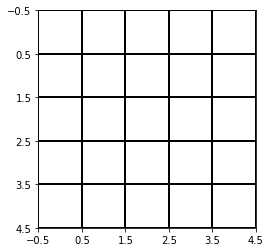

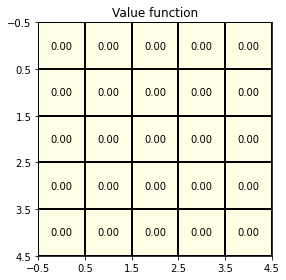

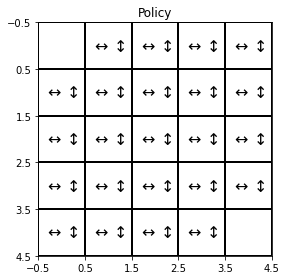

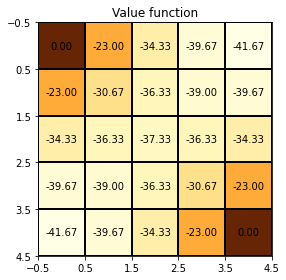

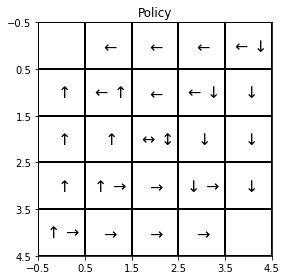

...

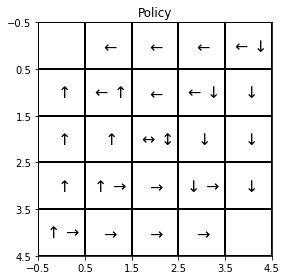

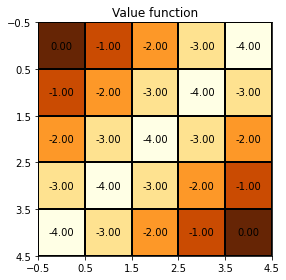

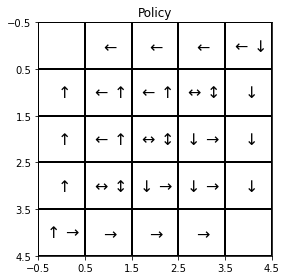

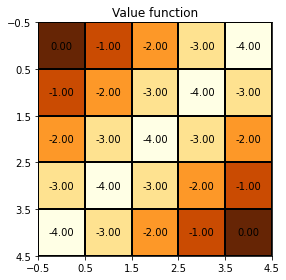

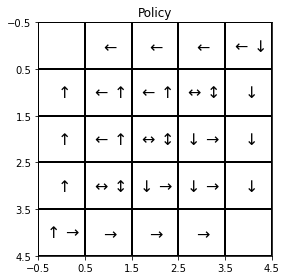

In [156]:
rewards_log,timesteps_log, max_reward_log, min_timesteps_log = [],[],[],[]
for seed in [1222,9881,333,34129,6523]:
  avg_reward, avg_timesteps, max_reward, min_timesteps = policy_iteration(5,1.0,
                                                                          1e-8, 
                                                                          seed)
  print("Seed-->",seed,"Average _reward",avg_reward,"Average Timesteps" ,
        avg_timesteps)
  rewards_log.append(avg_reward)
  timesteps_log.append(avg_timesteps)
  max_reward_log.append(max_reward)
  min_timesteps_log.append(min_timesteps)


In [157]:
print("Average reward per episode for 5 different seed")
print(rewards_log)
print("Average timesteps per episode for 5 different seed")
print(timesteps_log)


Average reward per episode for 5 different seed
[-1.4, -3.0, -2.4, -1.8, -2.6]
Average timesteps per episode for 5 different seed
[1.4, 3.0, 2.4, 1.8, 2.6]


### Value Iteration

In [162]:
def policy_eval_vi(env,v, policy, gamma, theta):
  delta = theta + 1
  i = 0
  reward = []
  timesteps = []

  while True:
    old_v = v.copy()
    delta = 0.0
    i += 1
    # Traverse all states
    for x in range(env.n):
      for y in range(env.n):
        # Run one iteration of the Bellman update rule for the value function
        # bellman_update(env, v, old_v, x, y, pi, gamma)
        check = check_terminal(env,x,y)
        vals =[]
        if check is False:
          for a in env.actions:
            # Get next state
            next_x, next_y = env.get_next_state(x, y, a)
            vals.append((env.rewards[next_x, next_y] + gamma * old_v[next_x, next_y]))
            # vals.append(policy[x, y, a] *(env.rewards[next_x,next_y] + gamma * old_v[next_x, next_y]))
            # if (x is 0 and y is 1) or (x is 1 and y is 0):
            #   print("actions", a)
            #   print(next_x,next_y,"vals", vals)
            # vals.append(policy[x, y, a] *(env.rewards[s_prime_x, s_prime_y] + gamma * old_v[s_prime_x, s_prime_y]))
          # print(vals, max(vals))
          v[x,y] = max(vals)
          # print(v[x,y],old_v[x,y])
        
        plot_v_values(v, env.n)

        # Compute difference
        delta = max(delta, abs(old_v[x, y] - v[x, y]))
    if i%5 ==0:
      policy_stable,policy = policy_improvement(env, v, policy, gamma)
      avg_reward,avg_timesteps,max_reward,min_timesteps =evaluate_policy(env,
                                                                       policy,5)
      reward.append(avg_reward)
      timesteps.append(avg_timesteps)
    if np.all(abs(v - old_v) < theta):
      print("Value Iteration ", i)
      break
  return reward,timesteps
  


In [163]:

def policy_improvement_val_itr(env, v, policy, gamma):
    policy_stable = True
    # Iterate states
    for x in range(env.n):
        for y in range(env.n):
            old_policy = policy[x, y, :].copy()
            # Iterate all actions
            best_actions = []
            max_v = None
            for a in env.actions:
                # Compute next state
                next_x, next_y = env.get_next_state(x, y, a)
                # Get value
                curr_val = env.rewards[next_x, next_y] + gamma * v[next_x, next_y]

                if max_v is None:
                    max_v = curr_val
                    best_actions.append(a)
                elif curr_val > max_v:
                    max_v = curr_val
                    best_actions = [a]
                elif curr_val == max_v:
                    best_actions.append(a)

            # Define new policy
            prob = 1.0#/len(best_actions)
            for a in env.actions:
              policy[x, y, a] = prob if a in best_actions else 0
            # Check whether the policy has changed
            if not (old_policy == policy[x, y, :]).all():
                policy_stable = False
    return policy_stable,policy


In [164]:
def value_iteration(size, gamma, theta, seed):
    terminal = [(0,0),(4,4)]

    # Create initial environment
    env = build_grid(size, terminal, seed)
    i = 0
    plot_grid(env)

    # Generate initial value function and policy
    # v = get_init_v(size, 0, env.x, env.y,env.x2,env.y2)
    v = np.zeros((size,size))
    # Value function of terminal state must be 0
    v[env.x, env.y] = 0
    v[env.x2,env.y2] = 0
    policy = 1/4 * np.ones((size, size, 4))
    
    # Plot initial value function and policy
    plot_v_values(v, env.n)
    plot_optimal_actions(env, policy)
    policy_stable = False
    # while not policy_stable:
    i += 1
    print("\nIteration {} of Policy Iteration algorithm".format(i))
    # Run the policy evaluation
    reward,timesteps = policy_eval_vi(env, v, policy, gamma, theta)
    # Run the policy improvement algorithm
    policy_stable,policy = policy_improvement_val_itr(env, v, policy, gamma)
    # policy_stable,policy = policy_improvement(env, v, policy, gamma)
    plot_optimal_actions(env, policy)
    # avg_reward, avg_timesteps, max_reward, min_timesteps = evaluate_policy(env,pi,episodes=5)
    print("\nPolicy Iteration algorithm converged after {} steps".format(i))
    return reward, timesteps




Iteration 1 of Policy Iteration algorithm


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Value Iteration  5

Policy Iteration algorithm converged after 1 steps
[-1.4] [1.4]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':



Iteration 1 of Policy Iteration algorithm
Value Iteration  5

Policy Iteration algorithm converged after 1 steps
[-3.0] [3.0]

Iteration 1 of Policy Iteration algorithm
Value Iteration  5

Policy Iteration algorithm converged after 1 steps
[-2.4] [2.4]

Iteration 1 of Policy Iteration algorithm
Value Iteration  5

Policy Iteration algorithm converged after 1 steps
[-1.8] [1.8]

Iteration 1 of Policy Iteration algorithm
Value Iteration  5

Policy Iteration algorithm converged after 1 steps
[-2.6] [2.6]


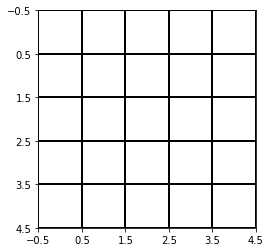

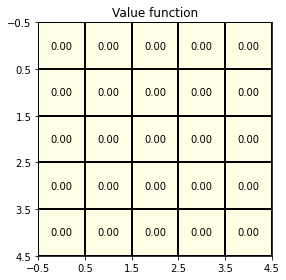

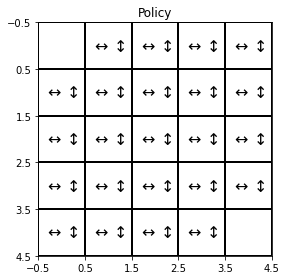

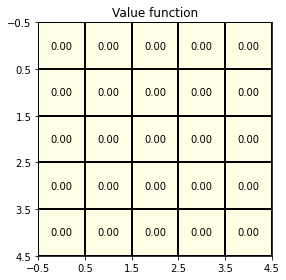

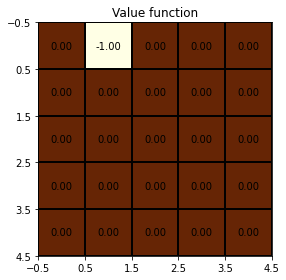

...

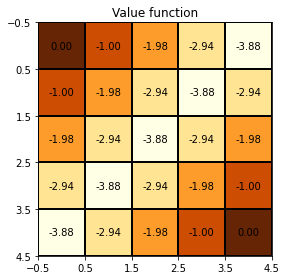

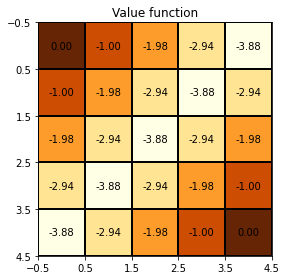

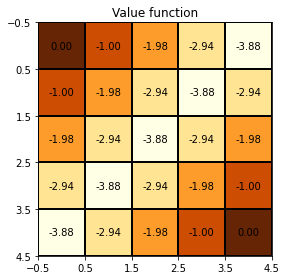

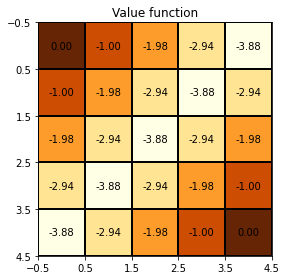

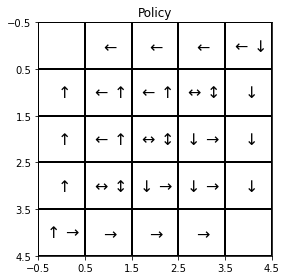

In [167]:
rewards_log,timesteps_log, max_reward_log, min_timesteps_log = [],[],[],[]
for seed in [1222,9881,333,34129,6523]:
  avg_reward, avg_timesteps = value_iteration(5, 0.98,1e-8,seed)
  print(avg_reward,avg_timesteps)
  rewards_log.append(np.asarray(avg_reward).mean(axis=0))
  timesteps_log.append(np.asarray(avg_timesteps).mean(axis=0))
  # max_reward_log.append(max_reward)
  # min_timesteps_log.append(min_timesteps)

In [168]:
print("Average reward per episode for 5 different seed")
print(rewards_log)
print("Average timesteps per episode for 5 different seed")
print(timesteps_log)


Average reward per episode for 5 different seed
[-1.4, -3.0, -2.4, -1.8, -2.6]
Average timesteps per episode for 5 different seed
[1.4, 3.0, 2.4, 1.8, 2.6]


### Ans 2.3 (b)

From the above visualisation for policy iteration and value itertion we can see that policy iteration takes more iterations to converge where as value iteration takes a sort of greedy approach to get the optimal policy.
